In [161]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline
plt.style.use('seaborn-pastel')

import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, Flatten, BatchNormalization, Conv2D, MaxPool2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy, binary_accuracy, Accuracy, Recall, Precision
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report

import skimage.io as skio
from skimage import io 
# from skimage.transform import resize, rotate

import pickle
import itertools
import os
import shutil
import random
import glob
from pathlib import Path
import re 

In [164]:
import src.plotting as plot
import src.prerocessing

In [154]:
print(keras.__version__)
tf.__version__

2.4.0


'2.3.1'

# Pre-Processing & Modeling

## EDA

In [9]:
def create_dataframe(dataset_dict):    
    df = pd.DataFrame(dataset_dict)
    return df

df = create_dataframe(data_dict)
df.head(2)

,folder_path,image_path,image_file_name,plant_type,condition
0,data_multi/archive/Tomato___Tomato_mosaic_virus,data_multi/archive/Tomato___Tomato_mosaic_viru...,tomato_virus_mosaic306.jpeg,tomato,virus_mosaic
1,data_multi/archive/Tomato___Tomato_mosaic_virus,data_multi/archive/Tomato___Tomato_mosaic_viru...,tomato_virus_mosaic312.jpeg,tomato,virus_mosaic


In [10]:
df_dist = pd.DataFrame(df.groupby('condition')['condition'].count())
df_dist['percent'] = df_dist / df_dist.sum()
df_dist = df_dist.sort_values(by="percent", ascending=False)

# df_dist['class_percent'] = pd.DataFrame(df.groupby('condition')['condition'].count().sort_values(ascending=False)) / pd.DataFrame(df.groupby('condition')['condition'].count().sort_values(ascending=False)).sum()
df_dist

,condition,percent
condition,,
healthy,12084,0.270960
haunglongbing,4406,0.098796
virus_yellow_leaf_curl,4286,0.096105
bacterial_spot,3493,0.078324
late_blight,2327,0.052178
mildew,2310,0.051797
early_blight,1600,0.035877
black_rot,1441,0.032312
septoria_spot,1417,0.031773


In [115]:
def rand_img_array(image_dir, num_imgs):
    imgs_names = []
    imgs_array = []
    
    for i in range(num_imgs):
        chosen_image = random.choice(os.listdir(image_dir))       
        image_path = image_dir  + '/' + chosen_image
        imgs_names.append(chosen_image)
        imgs_array.append(io.imread(image_path))
    return imgs_names, imgs_array

    
image_dir = df.folder_path.unique()[37]
num_imgs = 5
img_names, imgs = rand_img_array(image_dir, num_imgs)
imgs[0].shape

(256, 256, 3)

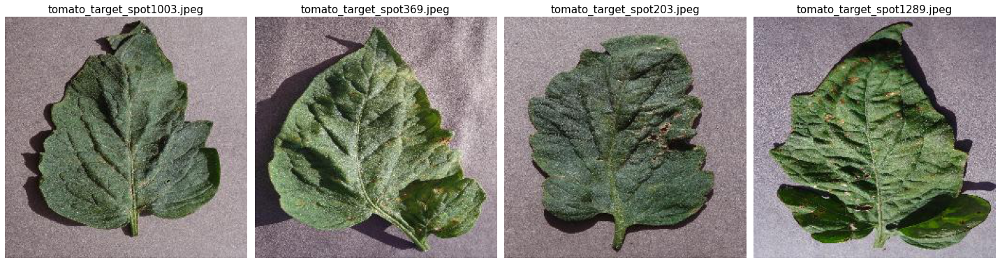

In [116]:
Target_Spot = df.folder_path.unique()[37]
img_names, imgs = rand_img_array(Target_Spot, num_imgs)
plot_img_1(imgs, img_names)

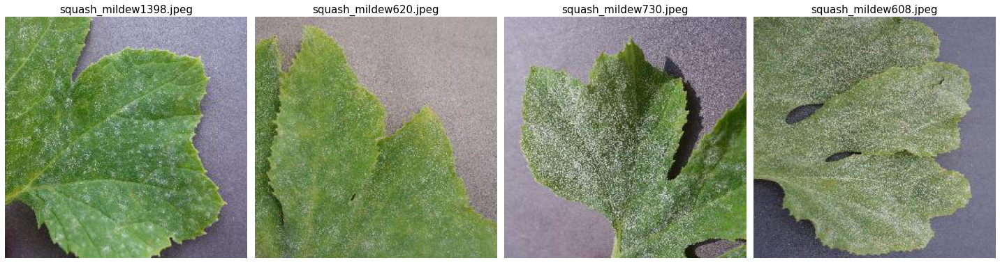

In [219]:
Squash___Powdery_mildew = df.folder_path.unique()[2]
img_names, imgs = rand_img_array(Squash___Powdery_mildew, num_imgs)
plot_img_1(imgs, img_names)

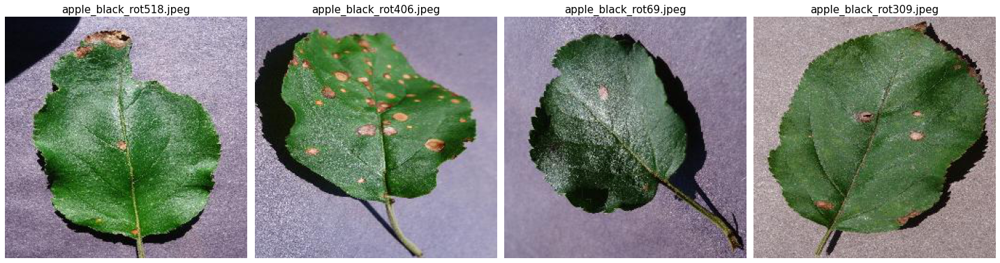

In [218]:
Apple___Black_rot = df.folder_path.unique()[24]
img_names, imgs = rand_img_array(Apple___Black_rot, num_imgs)
plot_img_1(imgs, img_names)

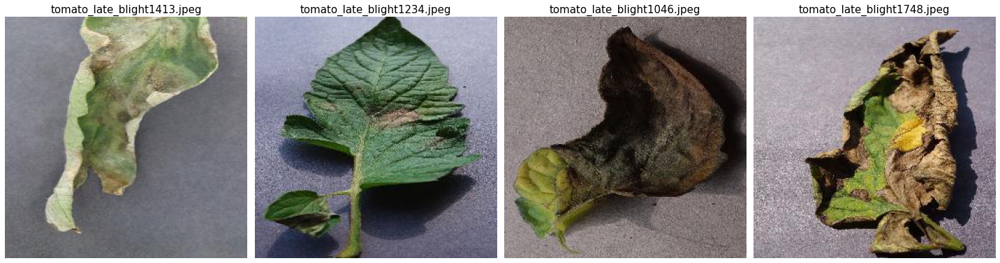

In [217]:
Tomato___Late_blight = df.folder_path.unique()[36]
img_names, imgs = rand_img_array(Tomato___Late_blight, num_imgs)
plot_img_1(imgs, img_names)

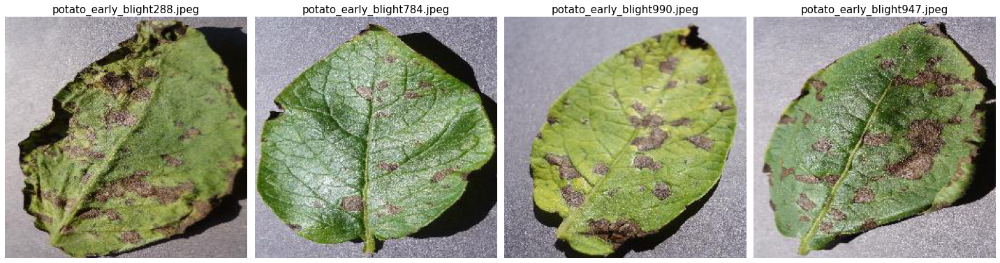

In [224]:
Potato___Early_blight = df.folder_path.unique()[20]
img_names, imgs = rand_img_array(Potato___Early_blight, num_imgs)
plot_img_1(imgs, img_names)

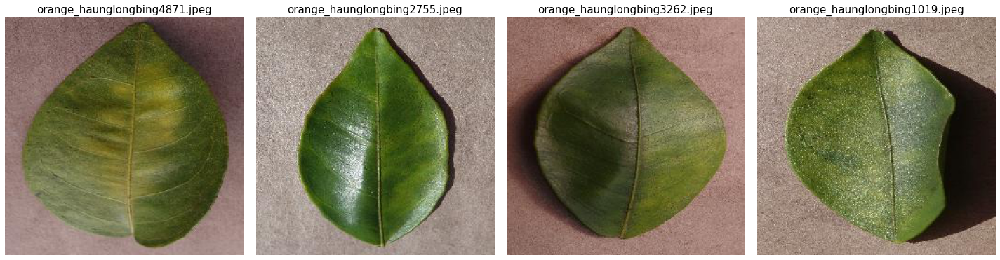

In [216]:
Orange___Haunglongbing_ = df.folder_path.unique()[13]
img_names, imgs = rand_img_array(Orange___Haunglongbing_, num_imgs)
plot_img_1(imgs, img_names)

#### Pixel Distributions

In [ ]:
red_values = [np.mean(train_images[idx][:,:,0]) for idx in range(len(train_images))]
green_values = [np.mean(train_images[idx][:,:,1]) for idx in range(len(train_images))]
blue_values = [np.mean(train_images[idx][:,:,2]) for idx in range(len(train_images))]

# All Channels
values = [np.mean(train_images[idx]) for idx in range(len(train_images))]



## Organize Data (Multi-Class Model)

In [58]:
Path('data_multi/').iterdir()

<generator object Path.iterdir at 0x7fd9f8f94820>

In [65]:
# rename images 
parent_dir = files_path[4]  
species = 'tomato'
condition = 'bacterial_spot'
class_name = species + '_' + condition

rename_imgs(parent_dir, class_name, file_type='.jpeg')      

'2127 renamed images'

In [2]:
def list_of_files(parent_dir):
    '''
    returns list of files inside a given directory
    
    ----Parameters----
    path : directory path --> 'data/images/'
    
    '''
    entries = Path(parent_dir)
    file_names = []
    for entry in entries.iterdir():
        file_names.append(entry.name)
    return file_names

parent_dir = 'data_multi/archive/'
file_names = list_of_files(parent_dir)
file_names[3], len(file_names)

('Corn_(maize)___healthy', 38)

In [3]:
def map_list_of_directories(file_names, parent_dir):
    '''
    returns : list, ['dir_loc/file_in_list']
    
    ----Parameters----
    file_names : list of files inside directory
    dir_loc : string, directory address    
    '''
    dir_lst = []
    for file in file_names:
        dir_lst.append(parent_dir+file)
    return dir_lst

parent_dir = 'data_multi/archive/'
files_path = map_list_of_directories(file_names, parent_dir)
files_path[5]

'data_multi/archive/Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot'

In [5]:
parent_dir = 'data_multi/archive/'

folder_path, image_path_lst, image_file_name_lst = [], [], []

data_dir = Path(parent_dir)

for folder in data_dir.iterdir():
    for image in list_of_files(str(folder)):
        image_path_lst.append(str(folder) + '/' + str(image))
        image_file_name_lst.append(image)
        folder_path.append(str(folder))

data_dict1 = {"folder_path" : folder_path,
              "image_path" : image_path_lst,
              "image_file_name" : image_file_name_lst }

print(data_dict1["folder_path"][:1])
print(data_dict1["image_path"][:1])
print(data_dict1["image_file_name"][:2])

['data_multi/archive/Tomato___Tomato_mosaic_virus']
['data_multi/archive/Tomato___Tomato_mosaic_virus/tomato_virus_mosaic306.jpeg']
['tomato_virus_mosaic306.jpeg', 'tomato_virus_mosaic312.jpeg']


In [6]:
def create_dataset_dict(image_file_name_lst): 
    plant_type, condition = [], []
    
    for idx, name in enumerate(image_file_name_lst):
#         path1 = re.split("/", name)
        path2 = re.split("/|_", name)      
        path3 = name.split("_",1)[1]
        path3 = re.findall(r'(\w+?)(\d+)', path3)[0][0]
#         print(name)
#         print(path2)
#         print(path3)
        plant_type.append(path2[0])
        condition.append(path3)

    data_dict = {"plant_type" : plant_type, 
                 "condition" : condition}                
    return data_dict

image_file_name_lst = data_dict1["image_file_name"]
data_dict2 = create_dataset_dict(image_file_name_lst)

In [7]:
data_dict = {**data_dict1, **data_dict2}
data_dict.keys()

dict_keys(['folder_path', 'image_path', 'image_file_name', 'plant_type', 'condition'])

In [8]:
print(len(data_dict['image_path']), len(data_dict["image_file_name"]),
      len(data_dict["plant_type"]), len(data_dict["condition"]))
# print(set(plant_type))
# print(set(condition))
print("\ntotal unique conditions: ",len(set(data_dict["condition"])))
print("total unique plants: ",len(set(data_dict["plant_type"])))

44597 44597 44597 44597

total unique conditions:  21
total unique plants:  14


## Create Classes

In [14]:
df_dist

,condition,percent
condition,,
healthy,12084,0.270960
haunglongbing,4406,0.098796
virus_yellow_leaf_curl,4286,0.096105
bacterial_spot,3493,0.078324
late_blight,2327,0.052178
mildew,2310,0.051797
early_blight,1600,0.035877
black_rot,1441,0.032312
septoria_spot,1417,0.031773


In [15]:
df_dist[:10].sum()

condition    34768.000000
percent          0.779604
dtype: float64

In [16]:
df_dist[:10].index.to_list()

['healthy',
 'haunglongbing',
 'virus_yellow_leaf_curl',
 'bacterial_spot',
 'late_blight',
 'mildew',
 'early_blight',
 'black_rot',
 'septoria_spot',
 'target_spot']

In [19]:
top_classes = df_dist[:10].index.to_list()
df_top_classes = df[df['condition'].isin(top_classes)]

In [20]:
df_top_classes = df_top_classes[["folder_path","image_path", "condition"]] 
df_top_classes.head(2)

,folder_path,image_path,condition
373,"data_multi/archive/Pepper,_bell___Bacterial_spot","data_multi/archive/Pepper,_bell___Bacterial_sp...",bacterial_spot
374,"data_multi/archive/Pepper,_bell___Bacterial_spot","data_multi/archive/Pepper,_bell___Bacterial_sp...",bacterial_spot


In [454]:
def class_file_list(parent_dir_path, species_type, condition):    
    pathname = parent_dir_path + species_type + condition
    class_file_list = glob.glob(pathname)
    return class_file_list 

def train_val_test_split_file(source_file_list, dest_path, set_type_dir, class_dir, move=False):
    '''
    Organize and copy/move samples into the training set, validation set, and test set 
    Returns list of moved/copied images.
    
    ----Parameters----
    source_file_list : list of files to sample from
    dest_path : destination directory --> 'data/'
    set_type_dir : training, validation, or test
    class_dir : class name or number 
    num_samples : number of files to move
    
    '''
    os.chdir(dest_path)  # change current working directory to the specified path
    source_file_list = glob.glob(class_dir_source + '/*')
    num_samples = int(np.round(len(source_file_list) * 0.2))
    
    dest_dir = set_type_dir + "/" + class_dir  
    img_list = []
    
    if os.path.isdir(dest_dir) is False:  # verify if the directory structure is already in place
        os.makedirs(dest_dir)

    for i in random.sample(source_file_list, num_samples): 
        shutil.move(i, dest_dir) 
        img_list.append(i)    
    os.chdir('../')  # revert working directory
    return num_samples   

In [470]:
len(glob.glob('data_multi/archive/*/*'))

44597

In [469]:
class_dir = "virus_yellow_leaf_curl"
class_dir_source = "archive/Tomato___Tomato_Yellow_Leaf_Curl_Virus"

dest_path = 'data_multi/'
set_type_dir = 'test'

# print(num_samples)
# tt = train_val_test_split_file(class_dir_source, dest_path, set_type_dir, class_dir, move=False)
samps.append(tt)
samps

[3000,
 459,
 199,
 214,
 124,
 236,
 200,
 200,
 1101,
 200,
 382,
 210,
 367,
 335,
 354,
 1071]

In [309]:
df_tt = df_top_classes.groupby(['condition', 'folder_path']).count()

image_path
condition              folder_path                                                   
bacterial_spot         data_multi/archive/Peach___Bacterial_spot                 2297
                       data_multi/archive/Pepper,_bell___Bacterial_spot           997
                       data_multi/archive/Tomato___Bacterial_spot                1071
black_rot              data_multi/archive/Apple___Black_rot                       621
                       data_multi/archive/Grape___Black_rot                      1180
early_blight           data_multi/archive/Potato___Early_blight                  1000
                       data_multi/archive/Tomato___Early_blight                  1000
haunglongbing          data_multi/archive/Orange___Haunglongbing_(Citr...        5507
healthy                data_multi/archive/Apple___healthy                        1645
                       data_multi/archive/Blueberry___healthy                    1502
                       data_multi/archive/Cherry_(including_sour)___he...         854
                       data_multi/archive/Corn_(maize)___healthy                 1162
                       data_multi/archive/Grape___healthy                         423
                       data_multi/archive/Peach___healthy                         360
                       data_multi/archive/Pepper,_bell___healthy                 1478
                       data_multi/archive/Potato___healthy                        152
                       data_multi/archive/Raspberry___healthy                     371
                       data_multi/archive/Soybean___healthy                      5090
                       data_multi/archive/Strawberry___healthy                    456
                       data_multi/archive/Tomato___healthy                       1591
late_blight            data_multi/archive/Potato___Late_blight                   1000
                       data_multi/archive/Tomato___Late_blight                   1909
mildew                 data_multi/archive/Cherry_(including_sour)___Po...        1052
                       data_multi/archive/Squash___Powdery_mildew                1835
mite_twospotted        data_multi/archive/Tomato___Spider_mites_Two-sp...        1676
septoria_spot          data_multi/archive/Tomato___Septoria_leaf_spot            1771
virus_yellow_leaf_curl data_multi/archive/Tomato___Tomato_Yellow_Leaf_...        5357

In [303]:
df_top_classes.condition.unique().tolist()

['bacterial_spot',
 'mildew',
 'healthy',
 'mite_twospotted',
 'haunglongbing',
 'early_blight',
 'black_rot',
 'late_blight',
 'virus_yellow_leaf_curl',
 'septoria_spot']

In [ ]:
print('training set (healthy, diseased):    {}, {}'.format(len(data_dct["train_healthy"]), len(data_dct["train_disease"]) ))
print('validation set (healthy, diseased):  {}, {}'.format(len(data_dct["validation_healthy"]), len(data_dct["validation_disease"]) ))
print('test set (healthy, diseased):        {}, {}'.format(len(data_dct["test_healthy"]), len(data_dct["test_disease"]) ))

## Organize data (Binary Model)

In [1159]:
# Organize data into train, valid, test dirs
os.chdir('data/') # change current working directory to the specified path
if os.path.isdir('valid/healthy') is True:  # verify if the directory structure is already in place
    os.makedirs('train/healthy')
    os.makedirs('train/disease')
    os.makedirs('valid/healthy')
    os.makedirs('valid/disease')
    os.makedirs('test/healthy')
    os.makedirs('test/disease')
    
    # moves samples into the training set, validation set, and test set  
    exclude = list(filter(lambda x: not re.search('healthy', x) 
                      and not re.search('train', x) and not re.search('valid', x) and not re.search('test', x),
                      glob.glob('archive/*/*')))
    train_h,train_d, val_h,val_d, test_h,test_d = [], [], [], [], [], []  
    
    for i in random.sample(glob.glob('archive/*healthy*/*healthy*'), 84):
        shutil.move(i, 'train/healthy') 
        train_h.append(i)  
    for i in random.sample(exclude, 20000):
        train_d.append(i)
        shutil.move(i, 'train/disease')         
    
    for i in random.sample(glob.glob('archive/*healthy*/*healthy*'), 1000):
        val_h.append(i)
        shutil.move(i, 'valid/healthy')         
    for i in random.sample(exclude, 1000):
        val_d.append(i)
        shutil.move(i, 'valid/disease') 

    for i in random.sample(glob.glob('archive/*healthy*/*healthy*'), 2000):
        test_h.append(i)
        shutil.move(i, 'test/healthy') 
    for i in random.sample(exclude, 1982):
        test_d.append(i)
        shutil.move(i, 'test/disease')

os.chdir('../')  # revert working directory

data_dct = {"train_healthy": train_h, "train_disease": train_d,
       "validation_healthy": val_h, "validation_disease": val_d,
       "test_healthy": test_h, "test_disease": test_d}

In [603]:
print('training set (healthy, diseased):    {}, {}'.format(len(data_dct["train_healthy"]), len(data_dct["train_disease"]) ))
print('validation set (healthy, diseased):  {}, {}'.format(len(data_dct["validation_healthy"]), len(data_dct["validation_disease"]) ))
print('test set (healthy, diseased):        {}, {}'.format(len(data_dct["test_healthy"]), len(data_dct["test_disease"]) ))

training set (healthy, diseased):    11000, 23000
validation set (healthy, diseased):  2000, 2001
test set (healthy, diseased):        2000, 2001


In [490]:
train_path = 'data/train'
valid_path = 'data/valid'
test_path = 'data/test'

In [302]:
print(train_batches.image_shape)

(256, 256, 3)


In [ ]:
# metrics: List of metrics to be evaluated by the model during training and testing. 
# Each of this can be a string (name of a built-in function), function or a `tf.keras.metrics.Metric` instance. 
# See `tf.keras.metrics`. Typically you will use `metrics=['accuracy']`. 
# A function is any callable with the signature `result = fn(y_true, y_pred)`. 

# To specify different metrics for different outputs of a multi-output model, you could also pass a dictionary, such as
# `metrics={'output_a': 'accuracy', 'output_b': ['accuracy', 'mse']}`.

# You can also pass a list (len = len(outputs)) of lists of metrics such as `metrics=[['accuracy'], ['accuracy', 'mse']]` or
# `metrics=['accuracy', ['accuracy', 'mse']]`. 

# When you pass the strings 'accuracy' or 'acc', we convert this to one of `tf.keras.metrics.BinaryAccuracy`,
# `tf.keras.metrics.CategoricalAccuracy`, `tf.keras.metrics.SparseCategoricalAccuracy` based on the loss
# function used and the model output shape. 
# We do a similar conversion for the strings 'crossentropy' and 'ce' as well.

In [153]:
#train_batches.flow_from_directory(
    directory,
    target_size=(256, 256),
    color_mode='rgb',
    classes=None,
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=None,
    save_to_dir=None,
    save_prefix='',
    save_format='png',
    follow_links=False,
    subset=None,
    interpolation='nearest')

Docstring:
Takes the path to a directory & generates batches of augmented data.

Arguments:
    directory: string, path to the target directory. It should contain one
      subdirectory per class. Any PNG, JPG, BMP, PPM or TIF images inside
      each of the subdirectories directory tree will be included in the
      generator. See [this script](
        https://gist.github.com/fchollet/0830affa1f7f19fd47b06d4cf89ed44d)
          for more details.
    
    target_size: Tuple of integers `(height, width)`, defaults to `(256,
      256)`. The dimensions to which all images found will be resized.
    
    color_mode: One of "grayscale", "rgb", "rgba". Default: "rgb". Whether
      the images will be converted to have 1, 3, or 4 channels.
    
    classes: Optional list of class subdirectories
        (e.g. `['dogs', 'cats']`). Default: None. If not provided, the list
          of classes will be automatically inferred from the subdirectory
          names/structure under `directory`, where each subdirectory will be
          treated as a different class (and the order of the classes, which
          will map to the label indices, will be alphanumeric). The
          dictionary containing the mapping from class names to class
          indices can be obtained via the attribute `class_indices`.
    
    class_mode: One of "categorical", "binary", "sparse",
        "input", or None. Default: "categorical".
        Determines the type of label arrays that are returned: -
          "categorical" will be 2D one-hot encoded labels, - "binary" will
          be 1D binary labels, "sparse" will be 1D integer labels, - "input"
          will be images identical to input images (mainly used to work with
          autoencoders). - If None, no labels are returned (the generator
          will only yield batches of image data, which is useful to use with
          `model.predict_generator()`). Please note that in case of
          class_mode None, the data still needs to reside in a subdirectory
          of `directory` for it to work correctly.
    
    batch_size: Size of the batches of data (default: 32).
    shuffle: Whether to shuffle the data (default: True) If set to False,
      sorts the data in alphanumeric order.
    seed: Optional random seed for shuffling and transformations.
    save_to_dir: None or str (default: None). This allows you to optionally
      specify a directory to which to save the augmented pictures being
      generated (useful for visualizing what you are doing).
    save_prefix: Str. Prefix to use for filenames of saved pictures (only
      relevant if `save_to_dir` is set).
    save_format: One of "png", "jpeg"
        (only relevant if `save_to_dir` is set). Default: "png".
    follow_links: Whether to follow symlinks inside
        class subdirectories (default: False).
    subset: Subset of data (`"training"` or `"validation"`) if
      `validation_split` is set in `ImageDataGenerator`.
    
    interpolation: Interpolation method used to resample the image if the
      target size is different from that of the loaded image. Supported
      methods are `"nearest"`, `"bilinear"`, and `"bicubic"`. If PIL version
      1.1.3 or newer is installed, `"lanczos"` is also supported. If PIL
      version 3.4.0 or newer is installed, `"box"` and `"hamming"` are also
      supported. By default, `"nearest"` is used.

# Build Model 

## Binary Class Model - Comeplete Dataset

In [1602]:
# PREPARE DATA
target_size = (256,256)
batch_size = 10

# augmentation configuration 
train_generator = ImageDataGenerator(rescale=1/255, rotation_range=10, width_shift_range=0.1, 
                           height_shift_range=0.1, zoom_range=0.1, 
                           horizontal_flip=True)

valid_generator = ImageDataGenerator(rescale=1/255, rotation_range=10, width_shift_range=0.1, 
                           height_shift_range=0.1, zoom_range=0.1, 
                           horizontal_flip=True)
test_generator = ImageDataGenerator(rescale=1/255)

# generator that will read pictures found in subfolers and indefinitely generate batches of augmented image data
# labels created based on image name
train_batches3 = train_generator.flow_from_directory(directory = train_path,
                                                              classes= ['healthy', 'disease'], 
                                                              target_size=target_size, batch_size=batch_size) 
                                                              #class_mode='binary')

valid_batches3 = valid_generator.flow_from_directory(directory = valid_path,
                                                  classes=['healthy', 'disease'], 
                                                  target_size=target_size, batch_size=batch_size)
                                                  #class_mode='binary')

test_batches3 = test_generator.flow_from_directory(directory = test_path, 
                                                classes=['healthy', 'disease'], 
                                                target_size=target_size, batch_size=batch_size, 
                                                #class_mode='binary',
                                                shuffle=False)  

Found 34084 images belonging to 2 classes.
Found 4000 images belonging to 2 classes.
Found 4000 images belonging to 2 classes.


In [1604]:
# BUILD MODEL
# TO DO: add dropout layer, try with less filters (16, 8)
input_shape = (256,256,3)

model3 = Sequential([    
            Conv2D(filters=32, kernel_size=(3, 3), padding = 'valid', # no padding around the edges
                   activation='relu', input_shape=input_shape),
            MaxPool2D(pool_size=(2, 2)),  # decreases size, helps prevent overfitting

            Conv2D(filters=64, kernel_size=(3, 3), padding = 'valid', activation='relu'),
            MaxPool2D(pool_size=(2, 2)), 
            Flatten(),  # Flatten to 1D feuture vectors (to feed into a DNN )

#             Dense(units=32,activation='softmax')
            Dense(units=32, activation='relu'),

            Dense(units=2, activation='softmax') 
                   ])
model3.summary()

model3.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_38 (Conv2D)           (None, 254, 254, 32)      896       
_________________________________________________________________
max_pooling2d_38 (MaxPooling (None, 127, 127, 32)      0         
_________________________________________________________________
conv2d_39 (Conv2D)           (None, 125, 125, 64)      18496     
_________________________________________________________________
max_pooling2d_39 (MaxPooling (None, 62, 62, 64)        0         
_________________________________________________________________
flatten_19 (Flatten)         (None, 246016)            0         
_________________________________________________________________
dense_30 (Dense)             (None, 32)                7872544   
_________________________________________________________________
dense_31 (Dense)             (None, 2)               

In [487]:
history3 = model3.fit_generator(train_batches3,
          steps_per_epoch = len(train_batches3),  # num of batches of samples for each epoch
          validation_data = valid_batches3,  
          validation_steps = len(valid_batches3),
          epochs = 10,
          verbose = 2 )  # view results: silent, progress bar, or line per epoch

Epoch 1/10
3400/3400 - 1529s - loss: 0.3266 - accuracy: 0.8595 - val_loss: 0.2775 - val_accuracy: 0.9128
Epoch 2/10
3400/3400 - 1567s - loss: 0.1621 - accuracy: 0.9394 - val_loss: 0.3013 - val_accuracy: 0.9375
Epoch 3/10
3400/3400 - 1576s - loss: 0.0959 - accuracy: 0.9650 - val_loss: 0.2961 - val_accuracy: 0.9427
Epoch 4/10
3400/3400 - 1579s - loss: 0.0589 - accuracy: 0.9805 - val_loss: 0.4188 - val_accuracy: 0.9315
Epoch 5/10
3400/3400 - 1575s - loss: 0.0472 - accuracy: 0.9845 - val_loss: 0.5829 - val_accuracy: 0.9252
Epoch 6/10
3400/3400 - 1572s - loss: 0.0277 - accuracy: 0.9921 - val_loss: 0.5797 - val_accuracy: 0.9298
Epoch 7/10
3400/3400 - 1569s - loss: 0.0257 - accuracy: 0.9921 - val_loss: 0.6151 - val_accuracy: 0.9330
Epoch 8/10
3400/3400 - 1562s - loss: 0.0245 - accuracy: 0.9926 - val_loss: 0.6836 - val_accuracy: 0.9430
Epoch 9/10
3400/3400 - 1562s - loss: 0.0134 - accuracy: 0.9960 - val_loss: 0.8225 - val_accuracy: 0.9452
Epoch 10/10
3400/3400 - 1566s - loss: 0.0173 - accuracy

In [693]:
model3.save("models/model3_10epochs.tf")

INFO:tensorflow:Assets written to: models/model3_10epochs.tf/assets


#### Evaluate

In [694]:
evaluate3 = model3.evaluate(valid_batches3)
print("test loss, test acc:", evaluate3)

test loss, test acc: [0.7009155750274658, 0.940750002861023]


In [695]:
preds3 = model3.predict(test_batches3, batch_size=20, verbose=1)
print("predictions shape:", preds3.shape)

predictions shape: (4000, 2)


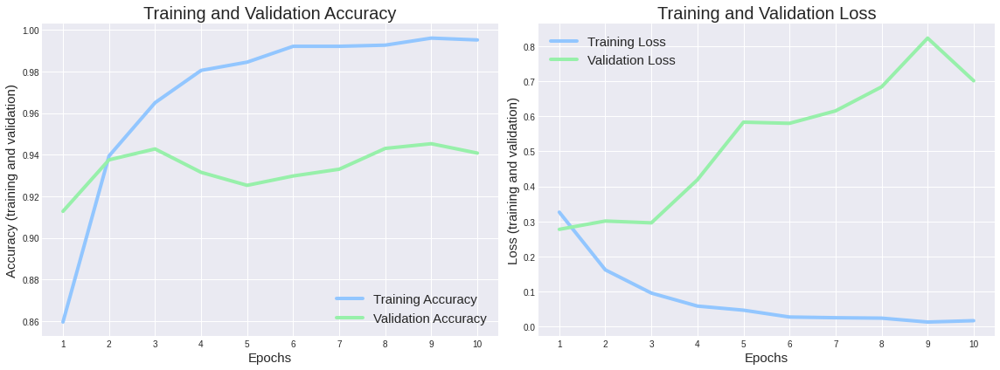

In [749]:
acc3 = history3.history['accuracy']
val_acc3 = history3.history['val_accuracy']
loss3 = history3.history['loss']
val_loss3 = history3.history['val_loss']
epochs_range = range(1,11)

plot_train_val_epochs(acc3, val_acc3, loss3, val_loss3, epochs_range)

[0.    0.068 1.   ] [0.    0.971 1.   ] [2 1 0]


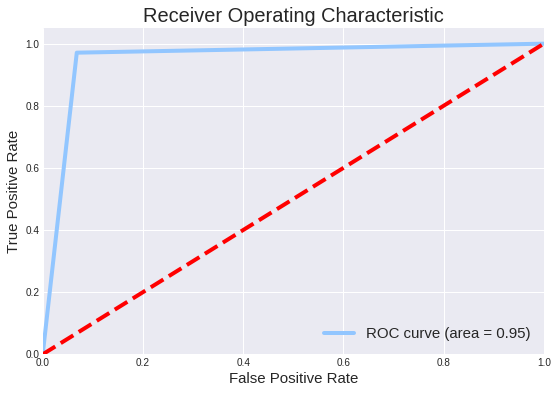

In [748]:
y_preds =np.argmax(preds3, axis=-1)
fpr3, tpr3, thresholds3 = roc_curve(test_batches.classes, y_preds)
print(fpr3, tpr3, thresholds3)
    
plot_roc_curve(fpr3, tpr3)

In [717]:
target_names = ['healthy', 'disease']
print(classification_report(test_batches.classes, np.argmax(preds3, axis=-1), target_names=target_names))

              precision    recall  f1-score   support

     healthy       0.97      0.93      0.95      2000
     disease       0.93      0.97      0.95      2000

    accuracy                           0.95      4000
   macro avg       0.95      0.95      0.95      4000
weighted avg       0.95      0.95      0.95      4000



Confusion matrix, without normalization
[[1864  136]
 [  58 1942]]


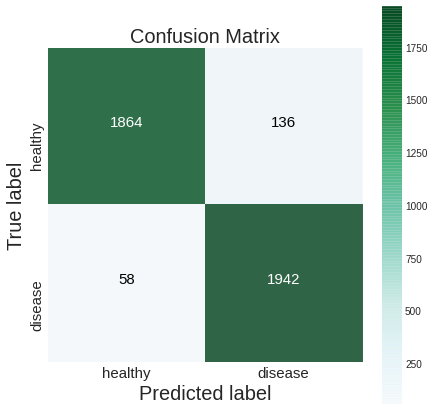

In [678]:
cm3 = confusion_matrix(y_true=test_batches.classes, y_pred=np.argmax(preds3, axis=-1))
cm_plot_labels = ['healthy','disease']

plot_confusion_matrix(cm=cm3, classes=cm_plot_labels, title='Confusion Matrix')

##  Binary Model : subset of data

In [1105]:
# PREPARE DATA
target_size = (256,256)
batch_size = 10

# augmentation configuration 
train_generator = ImageDataGenerator(rescale=1/255)
valid_generator = ImageDataGenerator(rescale=1/255) 
test_generator = ImageDataGenerator(rescale=1/255)

# generator that will read pictures found in subfolers and indefinitely generate batches of augmented image data
train_batches = train_generator.flow_from_directory(directory = train_path,classes= ['healthy', 'disease'], 
                                                              target_size=target_size, batch_size=batch_size) 
                                                              #class_mode='binary')

valid_batches = valid_generator.flow_from_directory(directory = valid_path,classes=['healthy', 'disease'], 
                                                  target_size=target_size, batch_size=batch_size)
                                                  #class_mode='binary')

test_batches = test_generator.flow_from_directory(directory = test_path, classes=['healthy', 'disease'], 
                                                target_size=target_size, batch_size=batch_size, shuffle=False)
                                                #class_mode='binary')  

Found 34000 images belonging to 2 classes.
Found 4000 images belonging to 2 classes.
Found 4000 images belonging to 2 classes.


In [462]:
# BUILD MODEL
# TO DO: add dropout layer, try with less filters (16, 8)
input_shape = (256,256,3)

model2 = Sequential([    
            Conv2D(filters=32, kernel_size=(3, 3), padding = 'valid', # no padding around the edges
                   activation='relu', input_shape=input_shape),
            MaxPool2D(pool_size=(2, 2)),  # decreases size, helps prevent overfitting

            Conv2D(filters=64, kernel_size=(3, 3), padding = 'valid', activation='relu'),
            MaxPool2D(pool_size=(2, 2)), 

            Flatten(),  # Flatten to 1D feuture vectors (to feed into a DNN )

#             Dense(units=32,activation='softmax')
            Dense(units=32, activation='relu'),

            Dense(units=2, activation='softmax') 
                   ])
model2.summary()

model2.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_28 (Conv2D)           (None, 254, 254, 32)      896       
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 127, 127, 32)      0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 125, 125, 64)      18496     
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 62, 62, 64)        0         
_________________________________________________________________
flatten_14 (Flatten)         (None, 246016)            0         
_________________________________________________________________
dense_21 (Dense)             (None, 32)                7872544   
_________________________________________________________________
dense_22 (Dense)             (None, 2)               

In [465]:
history2 = model2.fit_generator(train_batches,
          steps_per_epoch = len(train_batches),  # num of batches of samples for each epoch
          validation_data = valid_batches,  
          validation_steps = len(valid_batches),
          epochs = 10, verbose = 2 )  # view results: silent, progress bar, or line per epoch

Epoch 1/10
600/600 - 308s - loss: 0.5563 - accuracy: 0.7600 - val_loss: 0.3770 - val_accuracy: 0.8320
Epoch 2/10
600/600 - 311s - loss: 0.3011 - accuracy: 0.8728 - val_loss: 0.4013 - val_accuracy: 0.8248
Epoch 3/10
600/600 - 317s - loss: 0.2112 - accuracy: 0.9172 - val_loss: 0.5326 - val_accuracy: 0.8150
Epoch 4/10
600/600 - 320s - loss: 0.1314 - accuracy: 0.9472 - val_loss: 0.4041 - val_accuracy: 0.8773
Epoch 5/10
600/600 - 324s - loss: 0.0962 - accuracy: 0.9643 - val_loss: 0.3936 - val_accuracy: 0.8898
Epoch 6/10
600/600 - 327s - loss: 0.0644 - accuracy: 0.9768 - val_loss: 0.5497 - val_accuracy: 0.8640
Epoch 7/10
600/600 - 327s - loss: 0.0976 - accuracy: 0.9695 - val_loss: 0.5246 - val_accuracy: 0.8892
Epoch 8/10
600/600 - 330s - loss: 0.0353 - accuracy: 0.9885 - val_loss: 0.9306 - val_accuracy: 0.8702
Epoch 9/10
600/600 - 330s - loss: 0.0601 - accuracy: 0.9830 - val_loss: 0.6711 - val_accuracy: 0.8860
Epoch 10/10
600/600 - 331s - loss: 0.0230 - accuracy: 0.9950 - val_loss: 0.8458 - 

In [758]:
model2.save("models/model2_sub_10epochs.tf")

INFO:tensorflow:Assets written to: models/model2_sub_10epochs.tf/assets


In [759]:
evaluate2 = model2.evaluate(valid_batches)
print("test loss, test acc:", evaluate2)

400/400 [==============================] - 52s 130ms/step - loss: 0.8458 - accuracy: 0.8867
test loss, test acc: [0.8457987308502197, 0.8867499828338623]


In [478]:
preds2 = model2.predict(test_batches, verbose=1)

400/400 [==============================] - 54s 134ms/step


#### Evaluate

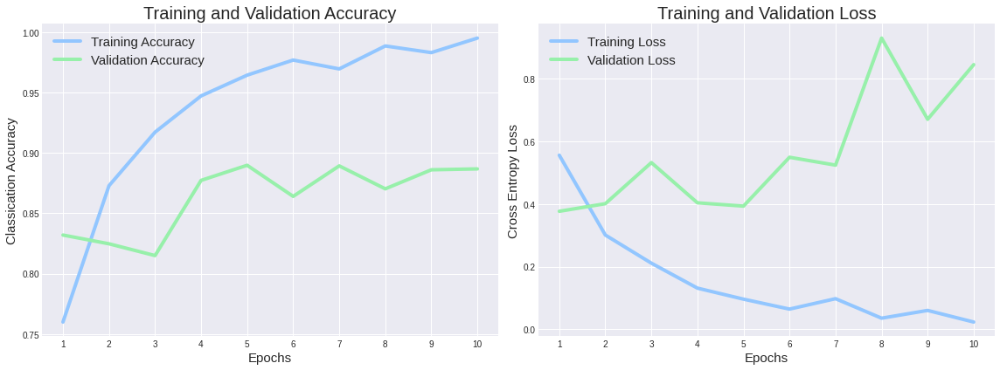

In [762]:
acc2 = history2.history['accuracy']
val_acc2 = history2.history['val_accuracy']
loss2 = history2.history['loss']
val_loss2 = history2.history['val_loss']
epochs_range = range(1,11)

plot_train_val_epochs(acc2, val_acc2, loss2, val_loss2, epochs_range)

[0.    0.088 1.   ] [0.     0.8905 1.    ] [2 1 0]


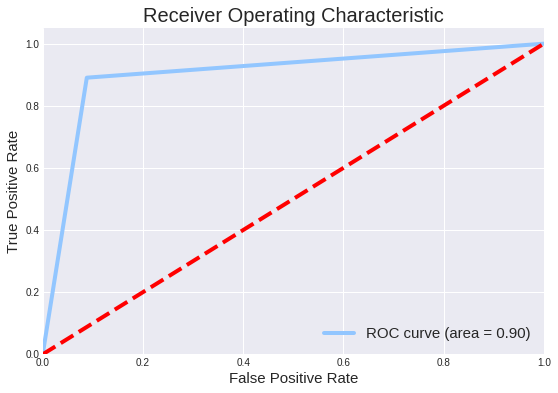

In [763]:
y_preds2 =np.argmax(preds2, axis=-1)
fpr2, tpr2, thresholds2 = roc_curve(test_batches.classes, y_preds2)
print(fpr2, tpr2, thresholds2)
    
plot_roc_curve(fpr2, tpr2)

In [718]:
print(classification_report(test_batches.classes, np.argmax(preds2, axis=-1), target_names=cm_plot_labels))

              precision    recall  f1-score   support

     healthy       0.89      0.91      0.90      2000
     disease       0.91      0.89      0.90      2000

    accuracy                           0.90      4000
   macro avg       0.90      0.90      0.90      4000
weighted avg       0.90      0.90      0.90      4000



Confusion matrix, without normalization
[[1824  176]
 [ 219 1781]]


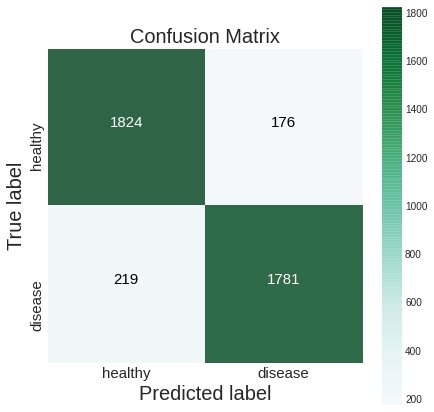

In [719]:
cm2 = confusion_matrix(y_true=test_batches.classes, y_pred=np.argmax(preds2, axis=-1))

cm_plot_labels = ['healthy','disease']
plot_confusion_matrix(cm=cm2, classes=cm_plot_labels, title='Confusion Matrix')

In [576]:
preds2[3090]

array([0.06878667, 0.9312133 ], dtype=float32)

In [ ]:
np.round(predictions)

## Visialize the layers

In [1177]:
layers4 = model4.layers

In [1187]:
filters4, biases4 = model4.layers[0].get_weights()

In [1188]:
print(layers4[0].name, filters4.shape)

conv2d_34 (3, 3, 3, 16)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


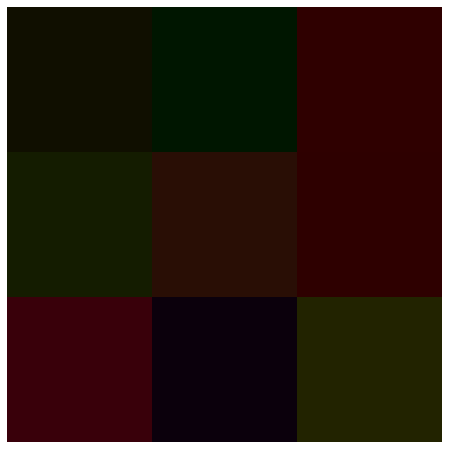

In [1222]:
fig, ax = plt.subplots(figsize=(8, 8))
filt = filters4[:, :, :, 5]

ax.imshow(filt)
ax.set_xticks([]); ax.set_yticks([]);


In [ ]:
layers4 = model4.layers
filters4, biases4 = model4.layers[0].get_weights()
print(layers4[0].name, filters4.shape)


fig1 = plt.figure(figsize=(12, 8))
columns = 4
rows = 4
n_filters = columns * rows
for i in range(1, n_filters +1):
#     f = filters4[:, :, :, i-1]
    
    fig1 = plt.subplot(2, 8, figsize=(20,4) )
    
    fig1.set_xticks([]); fig1.set_yticks([]), #axis off
#     plt.imshow(f[:, :, 0], cmap='gray') #Show only the filters from 0th channel (R)
    plt.imshow(filters4[:, :, :, i-1], figsize=(6,6)),
    break
#     ix += 1
plt.show()    

## Multi-Class Model

In [133]:
target_size = (224,224)
batch_size = 64

# img_gen = ImageDataGenerator(rescale=1/255, validation_split=0.15)

img_gen = ImageDataGenerator(rescale=1/255, validation_split=0.15,
                           rotation_range=180,    # measured in degrees
                         width_shift_range=0.1,    # measured as a fraction of the width of the image
                         height_shift_range=0.1, 
                         shear_range=.1, 
                         zoom_range=0.2,
                         horizontal_flip=True, vertical_flip=True
                            )


img_iter = img_gen.flow_from_dataframe(df_top_classes,
                                        shuffle=True,
    #                                     directory=images_dir,
                                        x_col='image_path',
                                        y_col='condition',
                                        class_mode='categorical',
                                        target_size=target_size,
                                        batch_size=batch_size,
                                        subset='training',
#                                         save_to_dir = 'data_multi/training'
                                    )

img_iter_val = img_gen.flow_from_dataframe(df_top_classes,
                                        shuffle=False,
    #                                     directory=images_dir,
                                        x_col='image_path',
                                        y_col='condition',
                                        class_mode='categorical',
                                        target_size=target_size,
                                        batch_size=batch_size,
                                        subset='validation',
#                                         save_to_dir = 'data_multi/training'
                                    )


test_path = 'data_multi/test/'
img_gen_test = ImageDataGenerator(rescale=1/255)
img_iter_test = img_gen_test.flow_from_directory(directory = test_path,
                                        shuffle=False,                           
                                        class_mode='categorical',
                                        target_size=target_size,
                                        batch_size=batch_size)



Found 29553 validated image filenames belonging to 10 classes.
Found 5215 validated image filenames belonging to 10 classes.


In [143]:
batch_size = 64
input_shape = (224,224,3)

model_multi = Sequential([    
            Conv2D(filters=32, kernel_size=(3, 3), 
                   activation='relu', input_shape=input_shape),
            MaxPool2D(pool_size=(2, 2)),  # decreases size, helps prevent overfitting

            Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
            MaxPool2D(pool_size=(2, 2)), 

            Flatten(),  # Flatten to 1D feuture vectors (to feed into a DNN )

#             Dense(units=32,activation='softmax')
            Dense(units=32, activation='relu'),

            Dense(units=10, activation='softmax') 
                   ])
model_multi.summary()

model_multi.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 54, 54, 64)        0         
_________________________________________________________________
flatten_8 (Flatten)          (None, 186624)            0         
_________________________________________________________________
dense_16 (Dense)             (None, 32)                5972000   
_________________________________________________________________
dense_17 (Dense)             (None, 10)               

In [ ]:
# TRAIN MODEL: batch_size = 64
history_multi2 = model_multi.fit_generator(img_iter,
                  steps_per_epoch = len(img_iter),  # num of batches of samples for each epoch
                  validation_data = img_iter_val,  
                  validation_steps = len(img_iter_val),
                  epochs = 20,
               # callbacks=[cp_callback],
                  verbose = 2)  # view results: silent, progress bar, or line per epoch

In [ ]:
mm_vpreds2 = model_multi.predict(img_iter_val)

In [ ]:
mm_vpreds_test2 = model_multi.predict(img_iter_test)
mm_eval2_test = model_multi.evaluate(img_iter_test)

In [147]:
model_multi.save("models/model_multi_20epochs.tf")

INFO:tensorflow:Assets written to: models/model_multi_20epochs.tf/assets


In [25]:
checkpoint_path = "models/multi.ckpt"

In [26]:
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path, 
    verbose=1, 
    save_weights_only=True,
    save_freq=1)

## vgg16

In [21]:
# vgg16 Info
from tensorflow.keras.applications import VGG16
# include top should be False to remove the softmax layer
pretrained_model = VGG16(include_top=False, weights='imagenet')
pretrained_model.summary()

58892288/58889256 [==============================] - 3s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
______________________________________________________________

In [682]:
history_vgg16 = model.fit(x = train_batches_vgg16, 
          steps_per_epoch = len(train_batches_vgg16), 
          validation_data = valid_batches_vgg16, 
          validation_steps = len(valid_batches_vgg16),
          epochs = 2,
          verbose = 2 )

Epoch 1/2
1700/1700 - 1688s - loss: 7.1252 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 2/2
1700/1700 - 1728s - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000


In [691]:
evaluate_vgg16 = model_vgg16.evaluate(test_batches_vgg16)
print("test loss, test acc:", evaluate_vgg16)

200/200 [==============================] - 53s 265ms/step - loss: 9.8633 - accuracy: 0.5245
test loss, test acc: [9.863313674926758, 0.5245000123977661]


In [690]:
preds_vgg16_2e = model_vgg16.predict(test_batches_vgg16)
print("predictions shape:", preds_vgg16_2e.shape)

predictions shape: (4000, 2)


# Evaluate Results 

In [ ]:
def predict(image):
    probabilities = model.predict(np.asarray([img]))[0]
    class_idx = np.argmax(probabilities)
    
    return {classes[class_idx]: probabilities[class_idx]}

for idx, filename in enumerate(random.sample(validation_generator.filenames, 5)):
    print("SOURCE: class: %s, file: %s" % (os.path.split(filename)[0], filename))
    
    img = load_image(filename)
    prediction = predict(img)
    print("PREDICTED: class: %s, confidence: %f" % (list(prediction.keys())[0], list(prediction.values())[0]))
    plt.imshow(img)
    plt.figure(idx)    
    plt.show()

In [1615]:
file_name_test_healthy = test_batches.filenames[:2000]
file_name_test_disease = test_batches.filenames[2000:]
file_name_test_disease[0]

# df test Healthy
index_test, class_test, image_name_test, plant_type_test, condition_test = [], [], [], [], [] 

for idx, name in enumerate(file_name_train_healthy):
    index_test.append(idx)
    
    path1 = re.split("/", name)
    image_name_test.append(path1[1])
    class_test.append(path1[0])
    
    path2 = re.split("/|_", name)
    plant_type_test.append(path2[1])

    condition_test.append('healthy')
    
print(len(index_test), len(class_test), len(condition_test), len(image_name_test), len(plant_type_test))
print("total unique conditions: ",len(set(condition_test)))
print("total unique plants: ",len(set(plant_type_test)))

2000 2000 2000 2000 2000
total unique conditions:  1
total unique plants:  12


In [1616]:
# df test Diseased
for idx, name in enumerate(file_name_train_disease):
    index_test.append(2001 + idx)
    
    path1 = re.split("/", name)
    path2 = re.split("/|_", name)
    path3 = name.split("_",1)[1]
    path3 = re.findall(r'(\w+?)(\d+)', path3)[0][0]
        
    image_name_test.append(path1[1])
    class_test.append(path1[0])
    plant_type_test.append(path2[1])
    condition_test.append(path3)

    
print(len(index_test), len(class_test), len(condition_test), len(image_name_test), len(plant_type_test))
print(set(plant_type_test))
print(set(class_test))
print("\ntotal unique conditions: ",len(set(condition_test)))
print("total unique plants: ",len(set(plant_type_test)))

4000 4000 4000 4000 4000
{'potato', 'peach', 'squash', 'corn', 'soybean', 'grape', 'blueberry', 'pepper', 'cherry', 'apple', 'raspberry', 'strawberry', 'tomato', 'orange'}
{'healthy', 'disease'}

total unique conditions:  22
total unique plants:  14


In [1617]:
preds = preds4  #preds3

test_dict = {#"index" : index_test,
              "class" : class_test,
              "image_name" : image_name_test,
              "plant_type" : plant_type_test,
              "condition" : condition_test,
              "prediction" : np.argmax(preds3, axis=-1).tolist(),
              "percent_healthy" : [np.format_float_positional(x, precision=6) for x in preds[:,0]],
              "percent_disease" : [np.format_float_positional(x, precision=6) for x in preds[:,1]]  }

df_test4 = pd.DataFrame(test_dict)
df_test4.replace("baterial_spot", "bacterial_spot", inplace=True)
df_test4['class'] = df_test4["class"].map( {'healthy':0, 'disease':1})
df_test4.head()

In [1618]:
df_test4 = pd.DataFrame(test_dict)
df_test4.replace("baterial_spot", "bacterial_spot", inplace=True)
df_test4['class'] = df_test4["class"].map( {'healthy':0, 'disease':1})
df_test4.head()

,class,image_name,plant_type,condition,prediction,percent_healthy,percent_disease
0,0,apple_healthy1002.jpeg,apple,healthy,0,0.961417,0.038583
1,0,apple_healthy1007.jpeg,apple,healthy,0,0.998389,0.001611
2,0,apple_healthy1008.jpeg,apple,healthy,0,0.00297,0.997030
3,0,apple_healthy1018.jpeg,apple,healthy,0,0.806112,0.193887
4,0,apple_healthy1055.jpeg,apple,healthy,0,0.912353,0.087647


In [1619]:
df_test4.to_csv("df_test4.csv")

In [ ]:
# df_train
condition_train, image_name_train, plant_type_train, class_train =  [], [], [], [] 

for name in train_batches.filenames:
  
    path1 = re.split("/", name)
    path2 = re.split("/|_", name)
    path3 = name.split("_",1)[1]
    path3 = re.findall(r'(\w+?)(\d+)', path3)[0][0]
    
    image_name_train.append(path1[1])
    class_train.append(path1[0])
    plant_type_train.append(path2[1])
    condition_train.append(path3)    

print(len(condition_train), len(image_name_train), len(plant_type_train), len(class_train))
print(set(plant_type_train))
print(set(class_train))

print("\ntotal unique conditions: ",len(set(condition_train)))
print("total unique plants: ",len(set(plant_type_train)))

In [ ]:
# df_val
condition_val, image_name_val, plant_type_val, class_val =  [], [], [], [] 

for name in valid_batches.filenames:
  
    path1 = re.split("/", name)
    image_name_val.append(path1[1])
    class_val.append(path1[0])
    
    path2 = re.split("/|_", name)
    plant_type_val.append(path2[1])
    
    path3 = name.split("_",1)[1]
    path3 = re.findall(r'(\w+?)(\d+)', path3)[0][0]
    condition_val.append(path3)    


print(len(condition_val), len(image_name_val), len(plant_type_val), len(class_val))
print(set(plant_type_val))
print(set(class_val))

print("\ntotal unique conditions: ",len(set(condition_val)))
print("total unique plants: ",len(set(plant_type_val)))

In [1282]:
# valid
val_dict = {#"index" : index_test,
              "class" : class_val,
              "image_name" : image_name_val,
              "plant_type" : plant_type_val,
              "condition" : condition_val, }

df_val = pd.DataFrame(val_dict)
df_val.replace("baterial_spot", "bacterial_spot", inplace=True)
df_val['class'] = df_val["class"].map( {'healthy':0, 'disease':1}) 
df_val.head(2)

,class,image_name,plant_type,condition
0,0,apple_healthy1000.jpeg,apple,healthy
1,0,apple_healthy1021.jpeg,apple,healthy


# Which disease types did the model predict best?

In [1625]:
df_test.head()

,class,image_name,plant_type,condition,prediction,percent_healthy,percent_disease,total_qty
0,0,apple_healthy1002.jpeg,apple,healthy,0,0.927964,0.072036,1
1,0,apple_healthy1007.jpeg,apple,healthy,0,1.,0.000000,1
2,0,apple_healthy1008.jpeg,apple,healthy,0,0.999750,0.00025,1
3,0,apple_healthy1018.jpeg,apple,healthy,0,0.999823,0.000177,1
4,0,apple_healthy1055.jpeg,apple,healthy,0,0.924481,0.075519,1


# Class Distribution

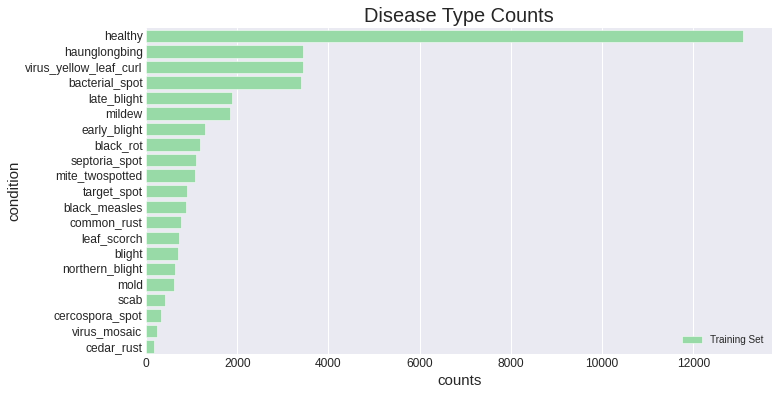

In [1315]:
f, ax = plt.subplots(figsize = (10,6))

sns.set_color_codes('pastel')
sns.barplot(y=df_train_counts2.index, x=df_train_counts2.total_qty, 
            label = "Training Set", color = 'g', edgecolor = 'w') ; 

# plt.figure(figsize = (10,10))

plt.ylabel("condition", fontsize = 15)
plt.xlabel("counts", fontsize = 15)
plt.title("Disease Type Counts", fontsize = 20);
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)

# sns.set_color_codes('muted')
# sns.barplot(y=df_test_counts.index, x=df_test_counts.total_qty, 
#             label = "Test Set", color = 'b', edgecolor = 'w')

ax.legend(ncol = 2, loc = 'lower right')
sns.despine(left = True, bottom = True)
plt.show();

In [1295]:
df_test_counts = df_test[["condition","total_qty"]]
df_test_counts = df_test_counts.groupby(["condition"]).sum().sort_values(by="total_qty", ascending=False)
# display(df_test_counts)

In [1307]:
df_train_counts = df_train[["condition","total_qty"]]
df_train_counts = df_train_counts.groupby(["condition"]).sum().sort_values(by="total_qty", ascending=False)
# df_train_counts

In [1317]:
df_train_counts2 = (df_train_counts + df_val_counts).sort_values(by="total_qty", ascending=False)
# df_train_counts2

In [1316]:
df_val_counts = df_val_[["condition","total_qty"]]
df_val_counts = df_val_counts.groupby(["condition"]).sum().sort_values(by="total_qty", ascending=False)
# df_val_counts

In [1237]:
# df_train.groupby("condition")["plant_type"].count().sort_values(ascending=False)

# More EDA 

In [1141]:
# df_train["total_qty"] = 1
df_train_ = df_train[["plant_type","condition",'class', "total_qty"]]
df_train_.head(2)

,plant_type,condition,class,total_qty
0,apple,healthy,0,1
1,apple,healthy,0,1


In [1285]:
df_val["total_qty"] = 1
df_val_ = df_val[["plant_type","condition",'class', "total_qty"]]
df_val_.head(2)

,plant_type,condition,class,total_qty
0,apple,healthy,0,1
1,apple,healthy,0,1


In [1145]:
df_test.head(2)

,class,image_name,plant_type,condition,prediction,percent_healthy,percent_disease,total_qty
0,0,apple_healthy1002.jpeg,apple,healthy,0,0.927964,0.072036,1
1,0,apple_healthy1007.jpeg,apple,healthy,0,1.,0.000000,1


In [1633]:
# df_test["total_qty"] = 1
# df_test_ = df_test[["plant_type","condition",'class', "prediction", "total_qty"]]
# df_test_['miss_count'] = df_test["class"] - df_test["prediction"]

# df_test4["total_qty"] = 1
# df_test4_ = df_test4[["plant_type","condition",'class', "prediction", "total_qty"]]
# df_test4_['miss_count'] = df_test4_["class"] - df_test4_["prediction"]

df_test4_.tail(2)

,plant_type,condition,class,prediction,total_qty,miss_count
3998,tomato,virus_yellow_leaf_curl,1,1,1,0
3999,tomato,virus_yellow_leaf_curl,1,1,1,0


In [1153]:
# ipython
from IPython.display import display, HTML

CSS = """
.output {
    flex-direction: row;
}
"""

HTML('<style>{}</style>'.format(CSS))

In [1630]:
df_test4.head(2) 
# df_test.head(2)

,class,image_name,plant_type,condition,prediction,percent_healthy,percent_disease,total_qty
0,0,apple_healthy1002.jpeg,apple,healthy,0,0.961417,0.038583,1
1,0,apple_healthy1007.jpeg,apple,healthy,0,0.998389,0.001611,1


In [1634]:
df_test4_.groupby(["condition","plant_type"]).sum().sort_values(by="miss_count")[12:]

,,class,prediction,total_qty,miss_count
condition,plant_type,,,,
virus_yellow_leaf_curl,tomato,254,254,254,0
early_blight,tomato,47,47,47,0
common_rust,corn,59,59,59,0
cercospora_spot,corn,26,26,26,0
cedar_rust,apple,16,16,16,0
blight,grape,54,54,54,0
black_measles,grape,69,69,69,0
northern_blight,corn,39,38,39,1
leaf_scorch,strawberry,50,49,50,1


In [1585]:
df_test_.groupby(["condition","plant_type"]).sum().sort_values(by="miss_count")[12:]

,,class,prediction,total_qty,miss_count
condition,plant_type,,,,
virus_yellow_leaf_curl,tomato,254,254,254,0
early_blight,tomato,47,47,47,0
common_rust,corn,59,59,59,0
cercospora_spot,corn,26,26,26,0
cedar_rust,apple,16,16,16,0
blight,grape,54,54,54,0
black_measles,grape,69,69,69,0
northern_blight,corn,39,38,39,1
leaf_scorch,strawberry,50,49,50,1


In [1173]:
display(df_train_.groupby(["condition"]).sum().sort_values(by="condition"))
display(df_test_.groupby(["condition"]).sum().sort_values(by="condition"))

,class,total_qty
condition,,
bacterial_spot,3122,3122
black_measles,792,792
black_rot,1084,1084
blight,637,637
cedar_rust,155,155
cercospora_spot,293,293
common_rust,724,724
early_blight,1178,1178
haunglongbing,3163,3163


,class,prediction,total_qty,miss_count
condition,,,,
bacterial_spot,302,299,302,3
black_measles,69,69,69,0
black_rot,82,78,82,4
blight,54,54,54,0
cedar_rust,16,16,16,0
cercospora_spot,26,26,26,0
common_rust,59,59,59,0
early_blight,96,95,96,1
haunglongbing,286,285,286,1


## Augmentation

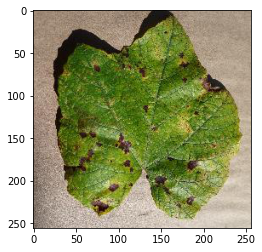

In [107]:
chosen_image = random.choice(os.listdir('data_multi/archive/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)/'))
image_path = 'data_multi/archive/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)/' + chosen_image
image = np.expand_dims(plt.imread(image_path), 0)
plt.imshow(image[0]);

In [112]:
gen_eda = ImageDataGenerator(
                           rotation_range=180,    # measured in degrees
                         width_shift_range=0.1,    # measured as a fraction of the width of the image
                         height_shift_range=0.1, 
                         shear_range=.2, 
                         zoom_range=0.2,
                         horizontal_flip=True, vertical_flip=True, brightness_range=(.5,1.5)
                    
                            )

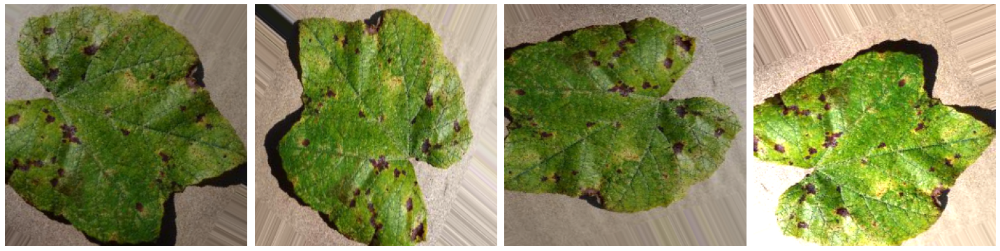

In [113]:
aug_iter = gen_eda.flow(image)
aug_images = [next(aug_iter)[0].astype(np.uint8) for i in range(10)]
plotImages(aug_images)

In [49]:
np.expand_dims(plt.imread(image_path), 0).shape

(1, 256, 256, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


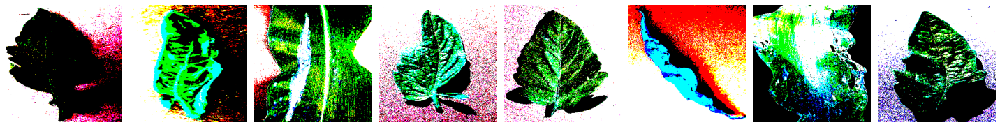

In [681]:
imgs, labels = next(train_batches_vgg16)   
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 8, figsize=(20,4))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

plotImages(imgs)
# print(labels)

In [48]:
plt.imread(image_path).shape

(256, 256, 3)

In [ ]:
aug_images = [next(aug_iter)[0].astype(np.uint8) for i in range(10)]

## Plot Images

In [ ]:
def disease_type(disease_type, rows, cols):
    fig,ax = plt.subplots(rows, cols, figsize=(12,12))
    disease_type = train['File'][train['Disease Type'] == disease_type].values
    n = 0
    for i in range(rows):
        for j in range(cols):
            image_path = os.path.join(data_dir, disease_type[n])
            ax[i, j].set_xticks([])
            ax[i, j].set_yticks([])
            ax[i, j].imshow(cv2.imread(image_path))
            n += 1

disease_type()

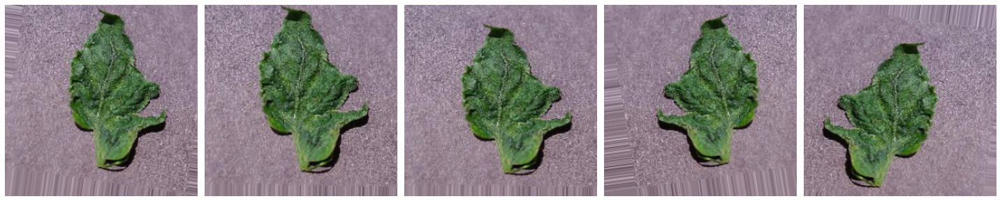

In [1587]:
# AUGMENTATION
chosen_image = random.choice(os.listdir(dir))
image_path = 'data-github/raw/color/backup_renamed/Tomato___Tomato_mosaic_virus/' + chosen_image

gen = ImageDataGenerator(rotation_range=10, width_shift_range=0.1, 
       height_shift_range=0.1, zoom_range=0.1, 
       horizontal_flip=True)

image = np.expand_dims(plt.imread(image_path),0)
# plt.imshow(image[0])

# Generate batches of augmented images from this image
aug_iter = gen.flow(image)

# Get 10 samples of augmented images
aug_images = [next(aug_iter)[0].astype(np.uint8) for i in range(5)]

def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

plotImages(aug_images)

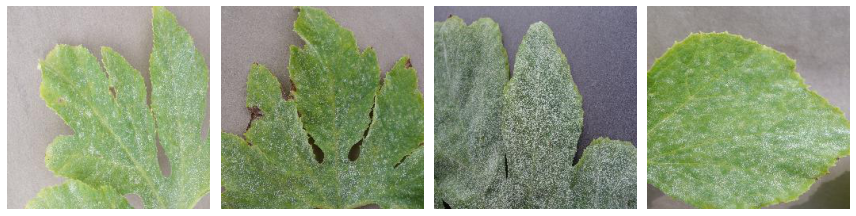

In [1488]:
lst = image1
_axs = range(141,145)

plt.subplots(figsize=(12,6))
for axis,img in zip(_axs,lst):
    plt.subplot(axis), plt.imshow(img);
    plt.axis('off')
plt.tight_layout()


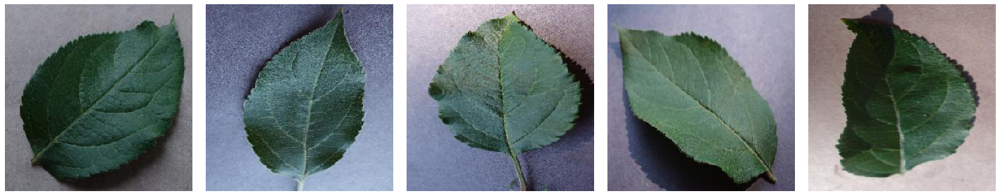

In [1410]:
plot_Images(next(test_batches)[0])

disease/tomato_septoria_spot1649.jpeg

Model 1 (trained on 15% of data)
0.00 percent healthy & 100.00 percent diseased

Final Model (trained on entire dataset):
1.35 percent healthy & 98.65 percent diseased


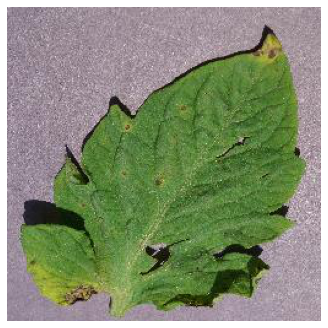

In [1597]:
def plot_image_prediction(idx):
    image_path = test_batches.filepaths[idx]
    print(test_batches.filenames[idx])

#     print("\nvg2: %.2f percent healthy & %.2f percent diseased"
#     % (100 * preds_vgg16_2e[idx][0], 100 * preds_vgg16_2e[idx][1]) )
    
#     print("M1s: %.2f percent healthy & %.2f percent diseased"
#     % (100 * (1 - preds[idx]), 100 * preds[idx]) )

    print("\nModel 1 (trained on 15% of data)")
    print("%.2f percent healthy & %.2f percent diseased"
    % (100 * preds2[idx][0], 100 * preds2[idx][1]) )
    
    print("\nFinal Model (trained on entire dataset):") 
    print("%.2f percent healthy & %.2f percent diseased"
    % (100 * preds3[idx][0], 100 * preds3[idx][1]) )

    fig, ax = plt.subplots(figsize=(5, 5))
    image = plt.imread(image_path)
    fig.tight_layout()
    plt.grid(False)
    ax.axis('off')
    ax.imshow(image);
    
plot_image_prediction(3583)

healthy/apple_healthy650.jpeg

vg2: 99.65 percent healthy & 0.35 percent diseased
M1s: 91.45 percent healthy & 8.55 percent diseased

M2s: 100.00 percent healthy & 0.00 percent diseased
M3t: 4.12 percent healthy & 95.88 percent diseased


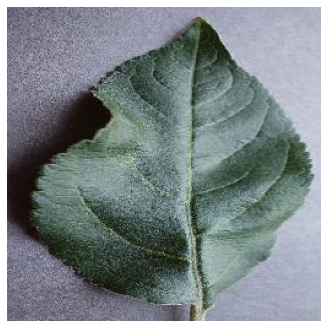

In [1588]:
plot_image_prediction(150)

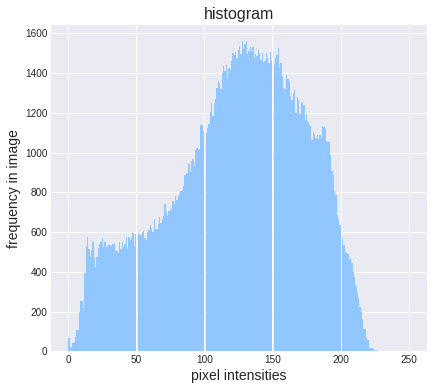

In [1002]:
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111)

ax.hist(image, bins=256)
ax.set_xlabel('pixel intensities', fontsize=14)
ax.set_ylabel('frequency in image', fontsize=14)
ax.set_title("histogram", fontsize=16);